In [1]:
import pandas as pd
import numpy as np
import openpyxl
import seaborn as sns
import plotly.express as px
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_excel('data/data.xlsx')
df = df[['Date','Station ID','Rider ID','Gauge In','Gauge Out','Amount']]
df.head()

,Date,Station ID,Rider ID,Gauge In,Gauge Out,Amount
0,2023-12-31 23:59:08,8,91,27,100,3650
1,2023-12-31 23:47:34,18,242,8,100,3956
2,2023-12-31 23:40:55,18,263,37,100,2709
3,2023-12-31 23:38:30,8,396,39,100,3050
4,2023-12-31 23:33:37,18,397,19,100,3345


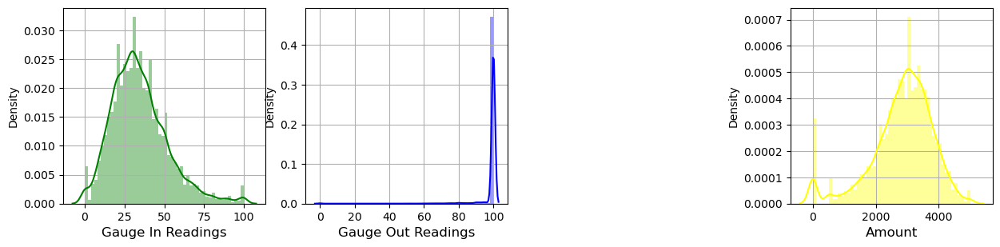

In [3]:
plt.rcParams['figure.figsize'] = (15,7)

plt.subplot(2,4,1)
sns.distplot(df['Gauge In'], color = 'green')
plt.xlabel('Gauge In Readings', fontsize = 12)
plt.grid()

plt.subplot(2,4,2)
sns.distplot(df['Gauge Out'], color = 'blue')
plt.xlabel('Gauge Out Readings', fontsize = 12)
plt.grid()

plt.subplot(2,4,4)
sns.distplot(df['Amount'], color = 'yellow')
plt.xlabel('Amount', fontsize = 12)
plt.grid()

### Cluster Analysis

In [4]:
features = ['Station ID', 'Rider ID','Gauge In', 'Gauge Out','Amount']

In [5]:
x_data = df[features].copy()
x_data.head()

,Station ID,Rider ID,Gauge In,Gauge Out,Amount
0,8,91,27,100,3650
1,18,242,8,100,3956
2,18,263,37,100,2709
3,8,396,39,100,3050
4,18,397,19,100,3345


### Scale the data

In [6]:
x_data = ((x_data-x_data.min())/(x_data.max()-x_data.min())) * 4+1
x_data.describe

<bound method NDFrame.describe of        Station ID  Rider ID  Gauge In  Gauge Out  Amount
0        1.000000  1.787746      2.08        5.0  3.9200
1        2.333333  3.109409      1.32        5.0  4.1648
2        2.333333  3.293217      2.48        5.0  3.1672
3        1.000000  4.457330      2.56        5.0  3.4400
4        2.333333  4.466083      1.76        5.0  3.6760
...           ...       ...       ...        ...     ...
15273    4.866667  1.831510      1.48        5.0  4.0272
15274    2.600000  2.943107      2.28        5.0  3.3392
15275    1.000000  3.301969      4.96        1.0  1.0000
15276    1.000000  2.015317      3.00        5.0  3.0000
15277    1.000000  1.612691      1.48        5.0  4.0272

[15278 rows x 5 columns]>

In [7]:
x_data.head()

,Station ID,Rider ID,Gauge In,Gauge Out,Amount
0,1.000000,1.787746,2.08,5.0,3.9200
1,2.333333,3.109409,1.32,5.0,4.1648
2,2.333333,3.293217,2.48,5.0,3.1672
3,1.000000,4.457330,2.56,5.0,3.4400
4,2.333333,4.466083,1.76,5.0,3.6760


### Initialize random centroids

In [8]:
def random_centroids(x_data,k):
    centroids = []
    for i in range(k):
        centroid = x_data.apply(lambda x: float(x.sample()))
        centroids.append(centroid)
    return pd.concat(centroids, axis=1)

In [9]:
centroids = random_centroids(x_data, 3)
centroids

,0,1,2
Station ID,3.800000,2.866667,3.533333
Rider ID,1.621444,4.002188,1.393873
Gauge In,2.160000,2.480000,1.800000
Gauge Out,4.440000,5.000000,4.600000
Amount,3.820800,2.817600,1.000000


### Label each data point 

In [10]:
def get_labels(x_data, centroids):
    distances = centroids.apply(lambda x: np.sqrt(((x_data-x) ** 2).sum(axis = 1)))
    return distances.idxmin(axis=1)

In [11]:
labels = get_labels(x_data, centroids)
labels

0        0
1        1
2        1
3        1
4        1
        ..
15273    0
15274    1
15275    1
15276    1
15277    0
Length: 15278, dtype: int64

In [12]:
labels.value_counts()

1    9516
0    5229
2     533
dtype: int64

### Updating centroids 

In [13]:
def new_centroids(x_data, labels, k):
    return x_data.groupby(labels).apply(lambda x: np.exp(np.log(x).mean())).T

In [14]:
from sklearn.decomposition import PCA

In [15]:
def plot_clusters(x_data, labels, centroids, iterations):
    pca = PCA(n_components=2)
    data_2d = pca.fit_transform(x_data)
    centroids_2d = pca.transform(centroids.T)
#     clear_output(wait=True)
    plt.title(f'Iteration {iteration}')
    plt.scatter(x=data_2d[:,0], y=data_2d[:,1], c=labels)
    plt.scatter(x=centroids_2d[:,0], y=centroids_2d[:,1])
    plt.show()

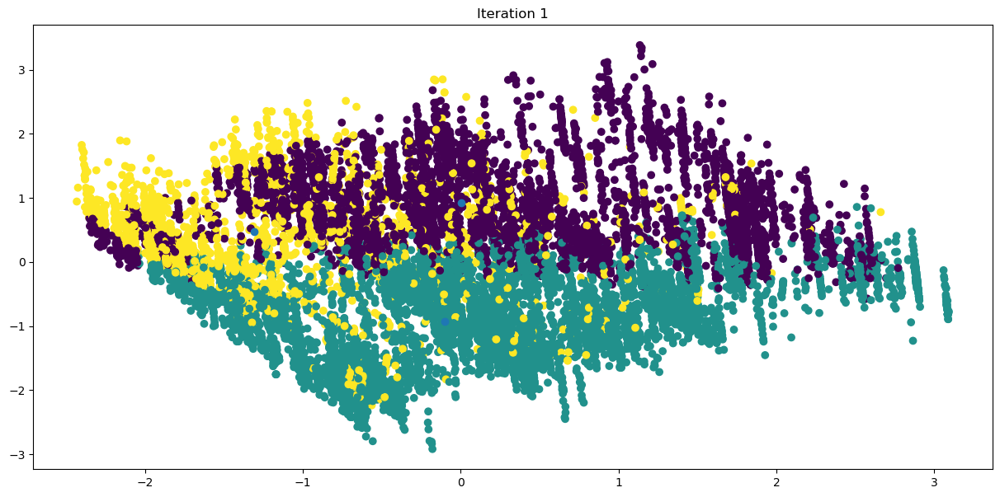

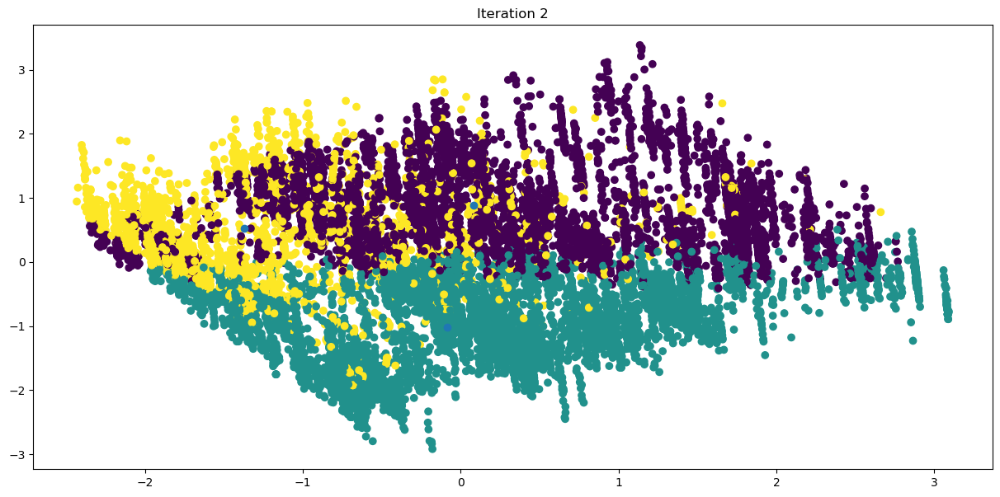

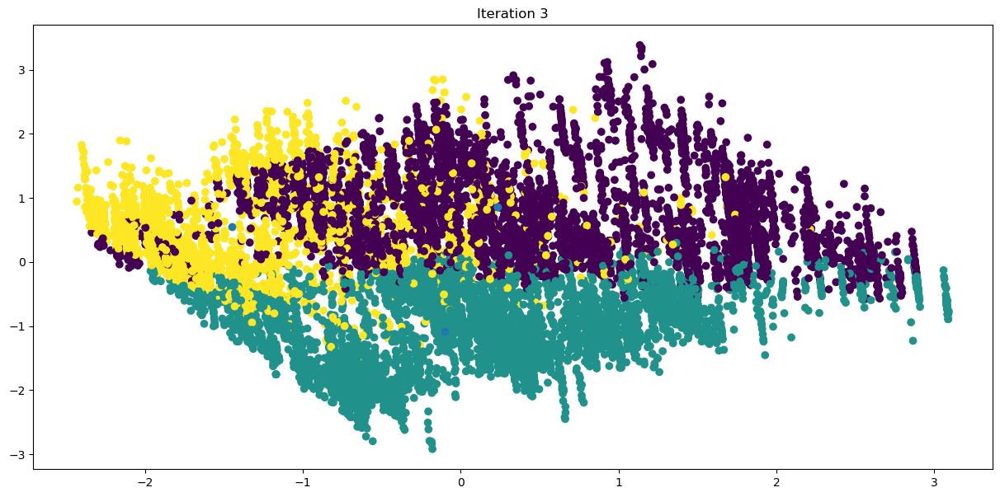

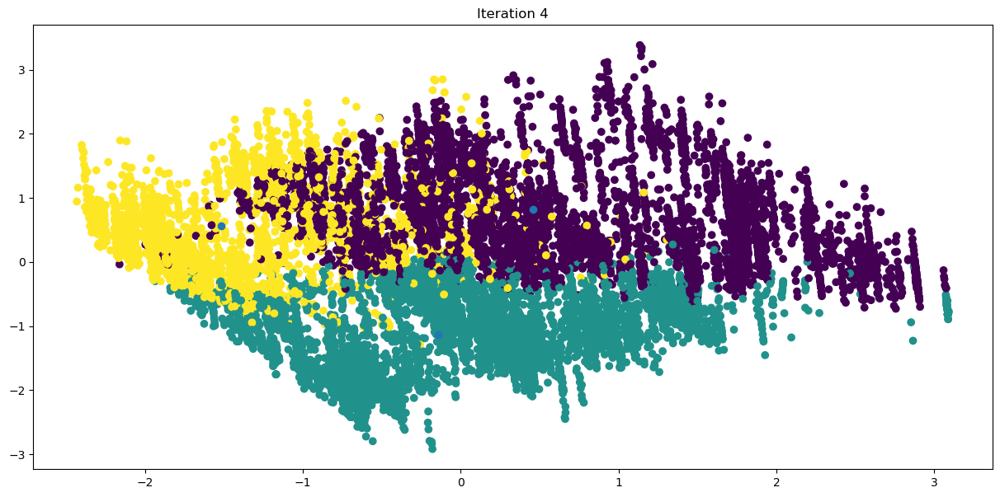

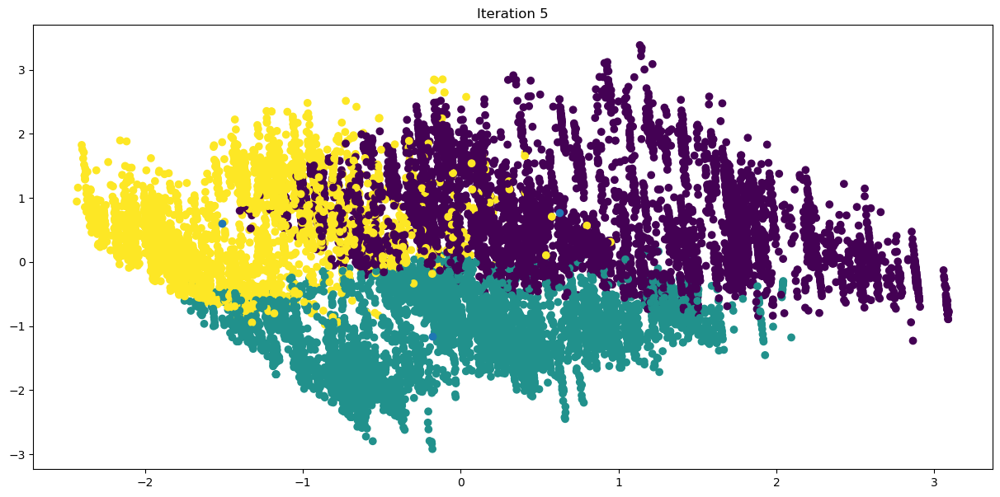

...

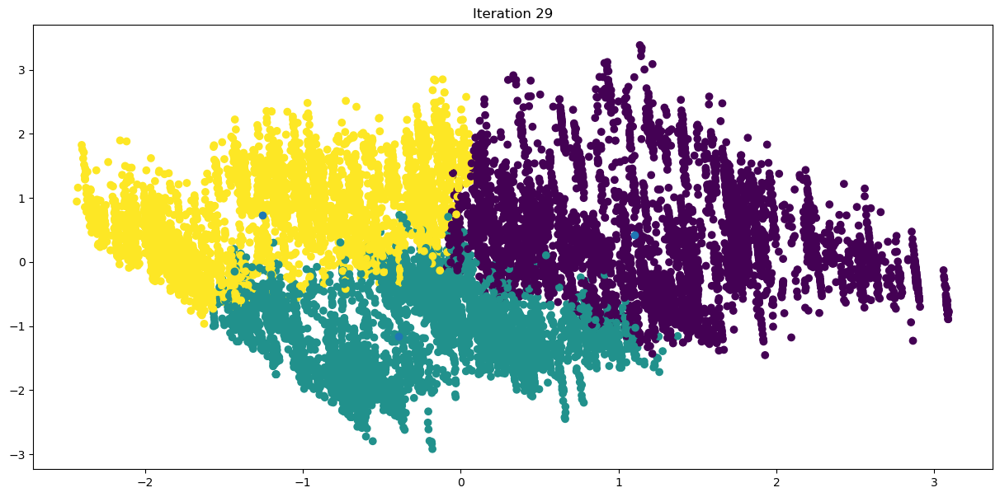

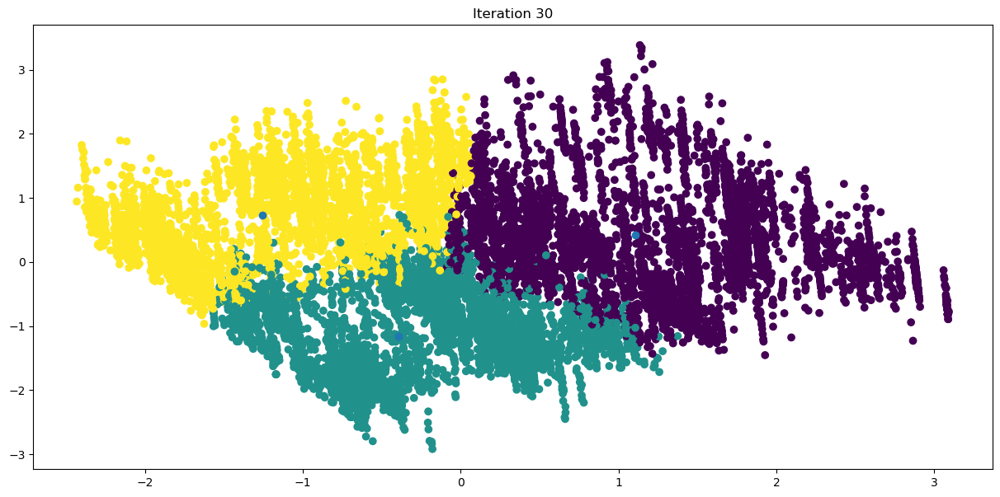

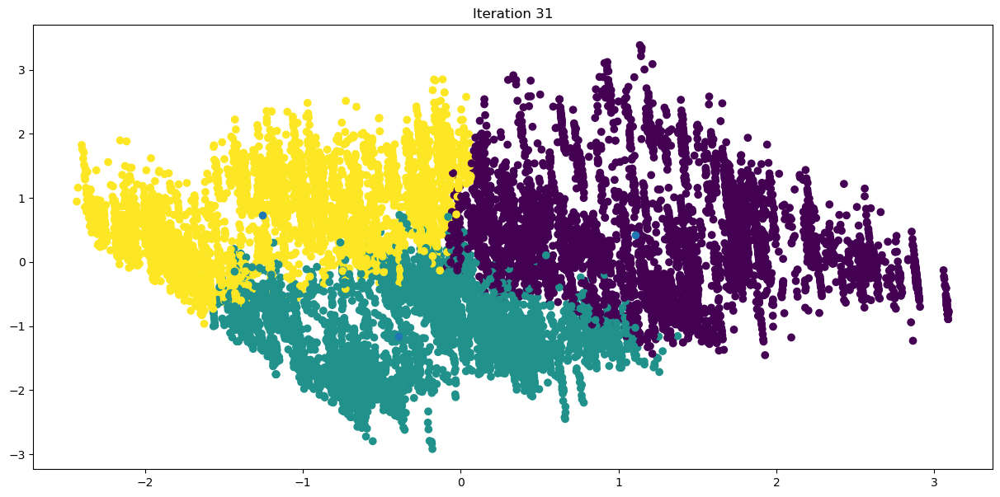

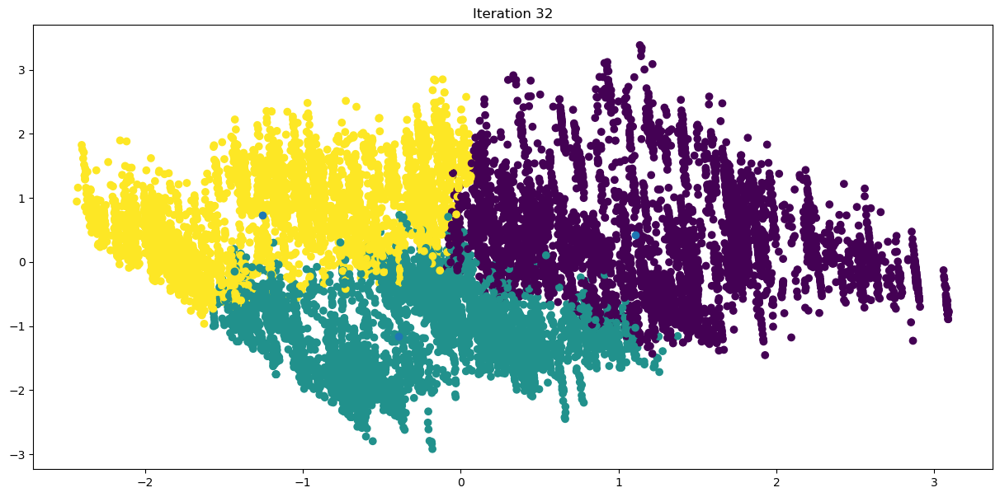

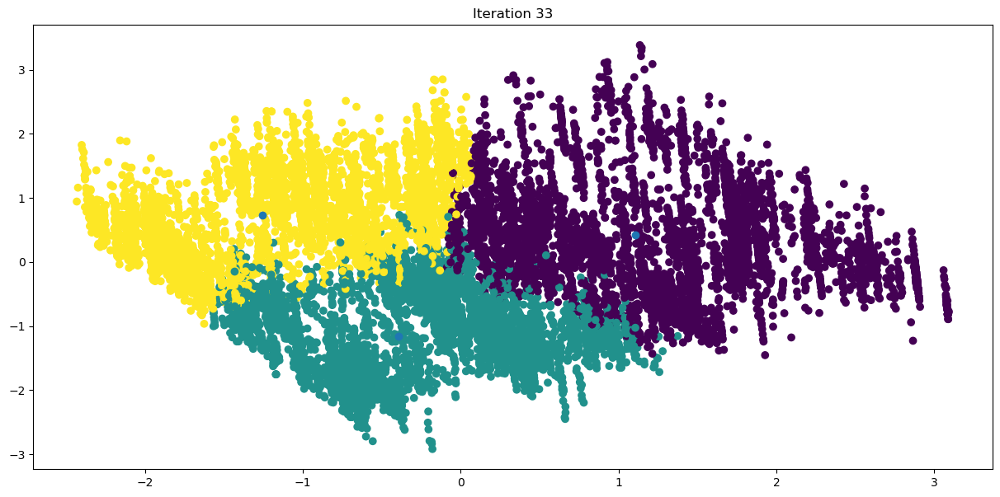

In [16]:
max_iterations = 100
k = 3

centroids = random_centroids(x_data, k)
old_centroids = pd.DataFrame()
iteration = 1

while iteration < max_iterations and not centroids.equals(old_centroids):
    old_centroids = centroids
    labels = get_labels(x_data, centroids)
    centroids = new_centroids(x_data, labels, k)
    plot_clusters(x_data, labels, centroids, iteration)
    iteration += 1

In [17]:
centroids

,0,1,2
Station ID,3.808379,1.710487,1.903441
Rider ID,3.088369,3.765622,1.657052
Gauge In,2.322997,2.172955,2.326295
Gauge Out,4.969015,4.913425,4.931450
Amount,3.192029,3.173264,3.121008


### Cluster 1

In [18]:
df[labels==0][["Rider ID", 'Station ID'] + features].describe()

,Rider ID,Station ID,Station ID,Rider ID,Gauge In,Gauge Out,Amount
count,5450.000000,5450.000000,5450.000000,5450.000000,5450.000000,5450.000000,5450.000000
mean,254.538349,29.486055,29.486055,254.538349,35.631743,99.316147,2874.724587
std,96.365151,4.945499,4.945499,96.365151,17.884121,4.208423,936.390309
min,1.000000,20.000000,20.000000,1.000000,0.000000,25.000000,0.000000
25%,196.000000,26.000000,26.000000,196.000000,23.000000,100.000000,2400.000000
50%,267.000000,29.000000,29.000000,267.000000,33.500000,100.000000,2974.000000
75%,328.000000,34.000000,34.000000,328.000000,46.000000,100.000000,3483.000000
max,458.000000,38.000000,38.000000,458.000000,100.000000,100.000000,5000.000000


### Cluster 2

In [19]:
df[labels==1][["Rider ID", 'Station ID'] + features].describe()

,Rider ID,Station ID,Station ID,Rider ID,Gauge In,Gauge Out,Amount
count,4880.000000,4880.000000,4880.000000,4880.000000,4880.000000,4880.000000,4880.000000
mean,322.327254,14.190984,14.190984,322.327254,31.547541,98.370287,2888.736680
std,66.754641,4.746322,4.746322,66.754641,16.429936,8.317953,993.893121
min,182.000000,8.000000,8.000000,182.000000,0.000000,0.000000,0.000000
25%,254.000000,10.000000,10.000000,254.000000,20.000000,100.000000,2494.000000
50%,340.000000,16.000000,16.000000,340.000000,30.000000,100.000000,3053.000000
75%,380.000000,18.000000,18.000000,380.000000,40.000000,100.000000,3526.000000
max,458.000000,24.000000,24.000000,458.000000,100.000000,100.000000,5000.000000


### Cluster 3

In [20]:
df[labels==2][["Rider ID", 'Station ID'] + features].describe()

,Rider ID,Station ID,Station ID,Rider ID,Gauge In,Gauge Out,Amount
count,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000
mean,84.847413,15.940784,15.940784,84.847413,35.621059,98.680679,2796.760509
std,58.429680,5.754348,5.754348,58.429680,17.769704,7.186047,947.086909
min,1.000000,8.000000,8.000000,1.000000,0.000000,0.000000,0.000000
25%,34.000000,10.000000,10.000000,34.000000,23.000000,100.000000,2322.000000
50%,75.000000,17.000000,17.000000,75.000000,33.000000,100.000000,2932.000000
75%,140.000000,20.000000,20.000000,140.000000,45.000000,100.000000,3440.000000
max,223.000000,27.000000,27.000000,223.000000,100.000000,100.000000,5000.000000


## Isolation Forests

In [27]:
# Scatter plot of Gauge readings by Amount
fig = px.scatter(df, x='Gauge Out', y='Amount', color='Gauge In', title='Distribution of Gauge readings by amount')
fig.show()

In [22]:
from sklearn.ensemble import IsolationForest

anomaly_inputs = ['Gauge Out','Amount']
model_IF = IsolationForest(contamination=0.01, random_state=42)
model_IF.fit(df[anomaly_inputs])

IsolationForest(contamination=0.01, random_state=42)

In [23]:
df['Anomaly Scores'] = model_IF.decision_function(df[anomaly_inputs])
df['Is Anomaly'] = model_IF.predict(df[anomaly_inputs])

In [24]:
df.loc[:, ['Date','Station ID', 'Rider ID','Gauge Out', 'Amount', 'Anomaly Scores', 'Is Anomaly']]
df['Is Anomaly'] = df['Is Anomaly'].map({-1: 'True', 1: 'False'})
df.head()

,Date,Station ID,Rider ID,Gauge In,Gauge Out,Amount,Anomaly Scores,Is Anomaly
0,2023-12-31 23:59:08,8,91,27,100,3650,0.308367,False
1,2023-12-31 23:47:34,18,242,8,100,3956,0.285480,False
2,2023-12-31 23:40:55,18,263,37,100,2709,0.333759,False
3,2023-12-31 23:38:30,8,396,39,100,3050,0.343457,False
4,2023-12-31 23:33:37,18,397,19,100,3345,0.335752,False


### Plotting Anomalies

In [25]:
fig = px.scatter(df, x='Gauge Out', y='Amount', color='Is Anomaly', hover_data=['Station ID', 'Rider ID', 'Gauge In', 'Anomaly Scores'])
fig.update_layout(title='Anomaly Detection in the Amount Paid', xaxis_title='Gauge Readings', yaxis_title='Amount')
fig.show()

In [26]:
anomalies = df[(df['Is Anomaly'] == "True")]
anomalies.to_csv('Anomalies.csv')